<a href="https://colab.research.google.com/github/FENGyukun/Building-Detection-MaskRCNN/blob/master/report2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -U git+https://github.com/albu/albumentations --no-cache-dir

  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-qd51i0bg
  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-qd51i0bg
     |████████████████████████████████| 47.6 MB 1.4 MB/s 
  Created wheel for albumentations: filename=albumentations-1.1.0-py3-none-any.whl size=104716 sha256=9d8182694191e3020e6845ce2edca44e64cfd26c8d8c31e64365030c504f500d
  Stored in directory: /tmp/pip-ephem-wheel-cache-yscrc90u/wheels/63/11/1a/c77caf3ae9b9b6d57b3ee5e6a41a50f3bc12c66a70f6b90bf0
Successfully built albumentations
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [ ]:
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# ======================
# Import Libs
# ======================

import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset
from torchvision.datasets.vision import VisionDataset
from torchvision import transforms
import pathlib
from copy import deepcopy
import cv2
import albumentations as albu
import matplotlib.pyplot as plt
import time
import copy

In [ ]:
# ======================
# Path
# ======================

data_dir = '/content/drive/My Drive/Colab/RS21/share/report2/data'
model_dir = '/content/drive/My Drive/Colab/RS21/share/report2/model/'
pred_dir = '/content/drive/My Drive/Colab/RS21/share/report2/result/'

x_train_dir = os.path.join(data_dir, 'train_img')
y_train_dir = os.path.join(data_dir, 'train_label')

x_val_dir = os.path.join(data_dir, 'val_img')
y_val_dir = os.path.join(data_dir, 'val_label')

In [ ]:
# ======================
# Config
# ======================

batch_size = 8
epochs = 50
img_size = 256
in_ch = 3 # number of input channels (RGB)
out_ch = 1 # number of output channels (1 for binary classification)
model_name = 'unet'
model_file = "%s_E%d_B%d.pth"%(model_name, epochs, batch_size)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
# ======================
# Custom dataset
# ======================

# https://github.com/qubvel/segmentation_models.pytorch

class RS21BD(VisionDataset):
    CLASSES = [
        "nonbuilding",
        "building",
    ]

    def __init__(
        self,
        images_dir,
        masks_dir,
        classes=None,
        augmentation=None,
    ):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.rgb_list = self._get_rgb_list()

        # convert str names to class values on masks
        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]

        self.augmentation = augmentation

    def _get_rgb_list(self):
        return list(sorted(pathlib.Path(self.images_dir).glob("*.png")))

    def __len__(self):
        return len(self.rgb_list)

    def __getitem__(self, index):
        rgb_path = self.rgb_list[index]
        rgb_fname = rgb_path.stem
        cls_path = os.path.join(self.masks_dir, rgb_fname + '.png')

        #image = imread(str(rgb_path))
        image = cv2.imread(str(rgb_path), cv2.IMREAD_COLOR)

        #mask = imread(str(cls_path))
        mask = cv2.imread(str(cls_path), cv2.IMREAD_UNCHANGED)
        mask[mask < 255] = 0  # non-buildings
        mask[mask == 255] = 1  # buildings
        mask = mask.astype('int64')

        # extract certain classes from mask (e.g. building)
        masks = [(mask == v) for v in self.class_values]
        mask = np.stack(masks, axis=-1).astype('int64')

        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask, str(rgb_path)

In [ ]:
# ======================
# Augmentation
# ======================

# https://github.com/albumentations-team/albumentations

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')

def to_tensor_labels(x, **kwargs):
    return x.transpose(2, 0, 1).astype('int64')

def get_training_augmentation():
    train_transform = [
        albu.HorizontalFlip(p=0.5),
        albu.VerticalFlip(p=0.5),
        albu.RandomRotate90(p=0.5),
        albu.Transpose(p=0.5),
        albu.Resize(img_size,img_size),
        albu.Lambda(image=to_tensor,mask=to_tensor),
    ]
    return albu.Compose(train_transform)

def get_val_augmentation():
    test_transform = [
        albu.Resize(img_size,img_size),
        albu.Lambda(image=to_tensor,mask=to_tensor),
    ]
    return albu.Compose(test_transform)

In [ ]:
# ======================
# Model
# ======================

# from https://github.com/gbaier/sat_img_synth/blob/master/models/unet.py

class UNet(nn.Module):
    def __init__(self, in_channels, n_classes, n_downsample=4):
        """
        Implementation of
        U-Net: Convolutional Networks for Biomedical Image Segmentation
        (Ronneberger et al., 2015)
        https://arxiv.org/abs/1505.04597
        Args:
            in_channels (int): number of input channels
            n_classes (int): number of output channels
            n_downsample (int): depth of the network
        """
        super().__init__()

        # input and output channels for the downsampling path
        out_channels = [64 * (2 ** i) for i in range(n_downsample)]
        in_channels = [in_channels] + out_channels[:-1]

        self.down_path = nn.ModuleList(
            [self._make_unet_conv_block(ich, och) for ich, och in zip(in_channels, out_channels)]
        )

        # input channels of the upsampling path
        in_channels = [64 * (2 ** i) for i in range(n_downsample, 0, -1)]
        self.body = self._make_unet_conv_block(out_channels[-1], in_channels[0])

        self.upsamplers = nn.ModuleList(
            [self._make_upsampler(nch, nch // 2) for nch in in_channels]
        )

        self.up_path = nn.ModuleList(
            [self._make_unet_conv_block(nch, nch // 2) for nch in in_channels]
        )

        self.last = nn.Conv2d(64, n_classes, kernel_size=1)

        self._return_intermed = False

    @staticmethod
    def _make_unet_conv_block(in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
        )

    @property
    def return_intermed(self):
        return self._return_intermed

    @return_intermed.setter
    def return_intermed(self, value):
        self._return_intermed = value

    def _make_upsampler(self, in_channels, out_channels):
        return nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)

    def forward(self, x):
        blocks = []
        for down in self.down_path:
            # UNet conv block increases the number of channels
            x = down(x)
            blocks.append(x)
            # Downsampling, by mass pooling
            x = F.max_pool2d(x, 2)

        x = self.body(x)

        for upsampler, up, block in zip(self.upsamplers, self.up_path, reversed(blocks)):
            # upsample and reduce number of channels
            x = upsampler(x)
            x = torch.cat([x, block], dim=1)
            # UNet conv block reduces the number of channels again
            x = up(x)

        x = self.last(x)

        if self.return_intermed:
            return x, blocks

        return x

In [ ]:
# ======================
# Function for training a model
# ======================

# modified from https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html

def train_model(model, criterion, optimizer, loader, n_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    train_accs = []
    val_accs = []

    for epoch in range(1, n_epochs + 1):
        print('Epoch {}/{}'.format(epoch, n_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for x, y, f in loader[phase]:

                img_in = x.to(device).float()
                img_out = y.to(device).float()

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    output = model.forward(img_in)
                    loss = criterion(output, img_out)
                    pred = (output > 0.5).long()

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * img_in.size(0)
                running_corrects += torch.sum(pred == img_out)

            epoch_loss = running_loss / len(loader[phase].dataset)

            if phase == 'train':
                epoch_acc = running_corrects.double() / (len(loader[phase].dataset) * img_size * img_size)
                train_accs.append(epoch_acc)
            else:
                epoch_acc = running_corrects.double() / (len(loader[phase].dataset) * img_size * img_size)
                val_accs.append(epoch_acc)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))
            
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                # save model
                torch.save(model, model_dir+model_file)
                print('Model saved!')


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    plt.plot(np.array(train_accs), 'r')
    plt.plot(np.array(val_accs), 'b')
    plt.show()

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [ ]:
# ======================
# Dataset
# ======================

CLASSES =  ["building"]

train_dataset = RS21BD(
    x_train_dir,
    y_train_dir,
    augmentation=get_training_augmentation(),
    classes=CLASSES,
    )

val_dataset = RS21BD(
    x_val_dir,
    y_val_dir,
    augmentation=get_val_augmentation(),
    classes=CLASSES,
    )

dataloaders = {'train': DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=1),
              'val': DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=1)}

In [ ]:
# ======================
# Model set up & traning
# ======================
train_mode = False

criterion = torch.nn.BCEWithLogitsLoss()
model = UNet(in_ch, out_ch).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
#optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
if train_mode == True:
  model = train_model(model, criterion, optimizer, dataloaders, epochs)
else:
  # load best saved checkpoint
  model = torch.load(model_dir+model_file)

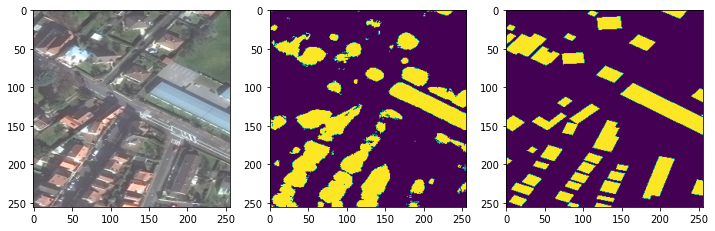

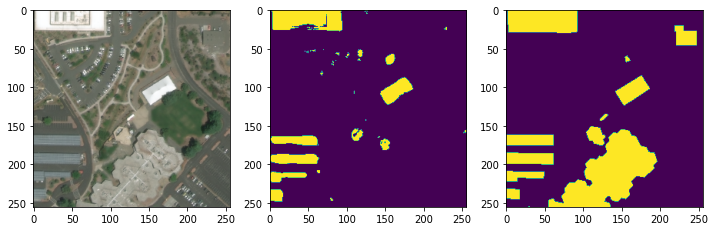

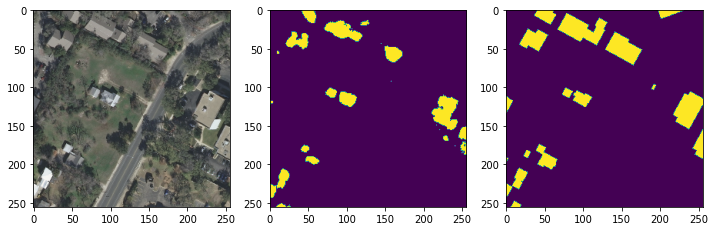

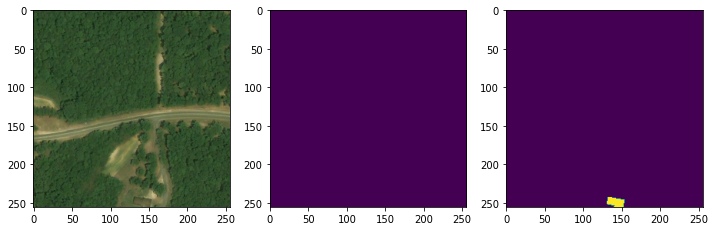

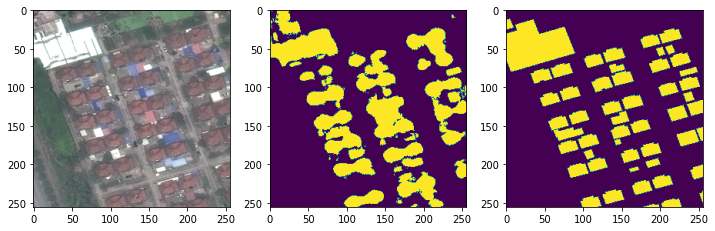

...

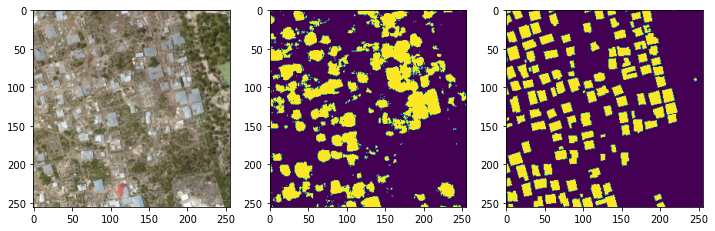

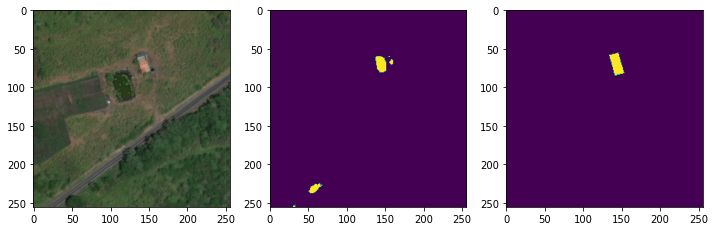

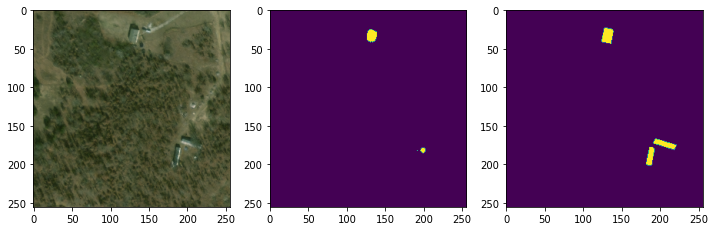

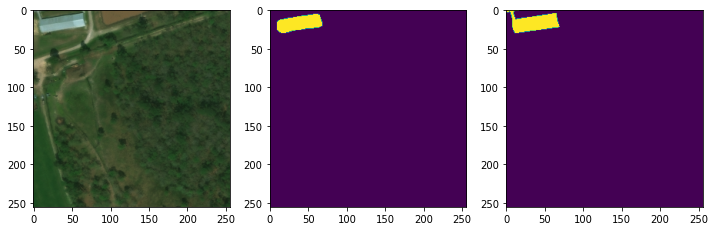

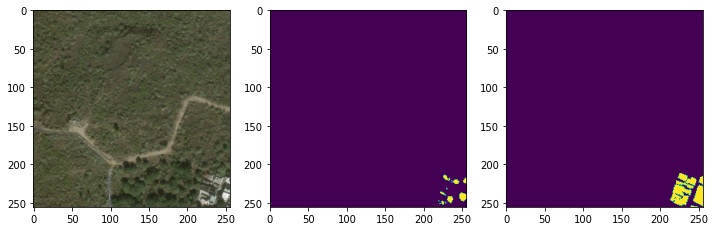

In [ ]:
# ======================
# Visualize results for val set
# ======================

model.eval()

for n in range(len(val_dataset)):
    input, output, rgb_path = val_dataset[n]
    x_tensor = torch.from_numpy(input).to(device).unsqueeze(0)
    output = output.squeeze()

    prediction = model(x_tensor)
    prediction = (prediction > 0).long().squeeze().cpu().numpy().round()

    rgb = input.transpose(1, 2, 0)

    plt.figure(figsize=(12,12))
    plt.subplot(1,3,1)
    plt.imshow(rgb[:,:,[2,1,0]]/255)
    plt.subplot(1,3,2)
    plt.imshow(prediction)
    plt.subplot(1,3,3)
    plt.imshow(output)
    plt.show()

    rgb_fname = pathlib.Path(rgb_path).stem
    prediction = (prediction*255).astype('uint8')
    prediction = cv2.resize(prediction, (512, 512), interpolation=cv2.INTER_CUBIC)
    # save prediction with the original image size
    cv2.imwrite(pred_dir + rgb_fname + '.png', prediction)

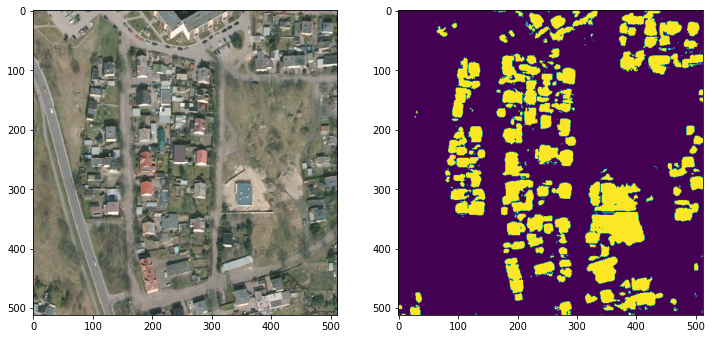

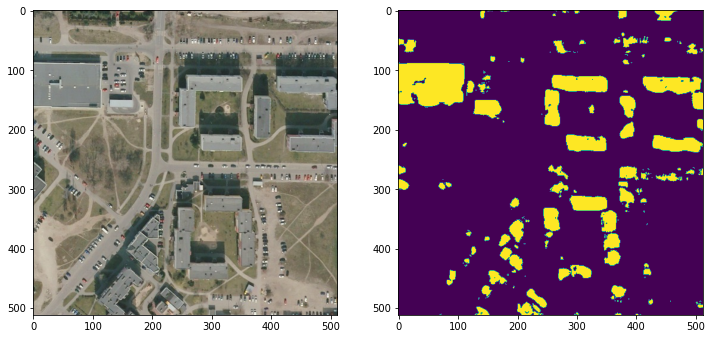

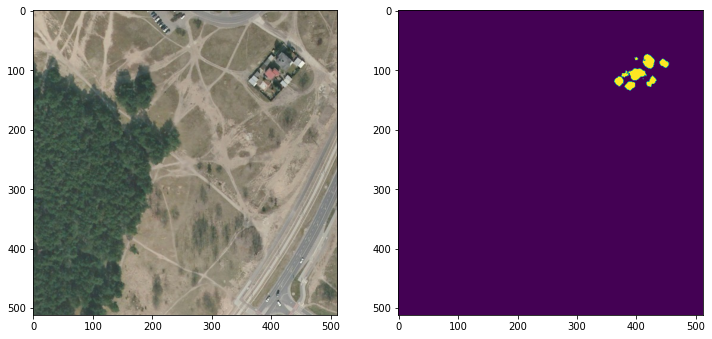

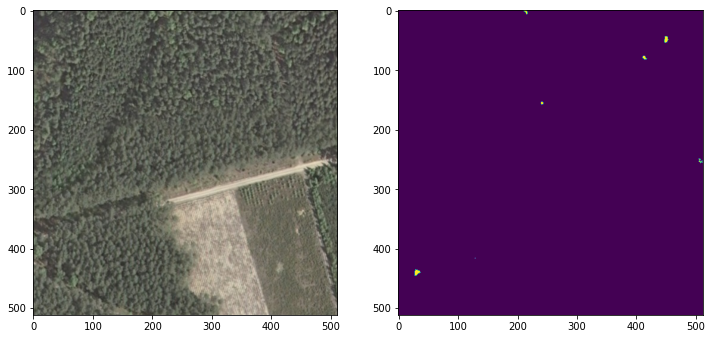

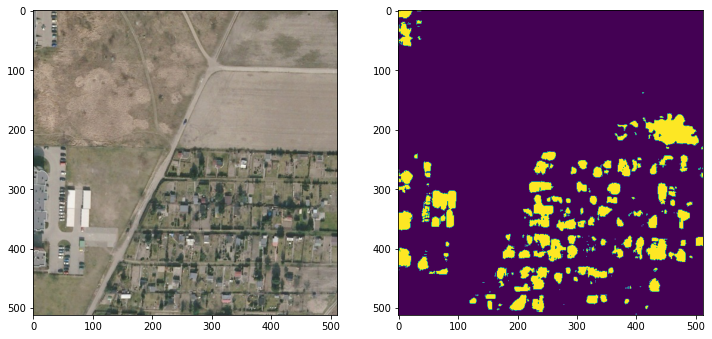

...

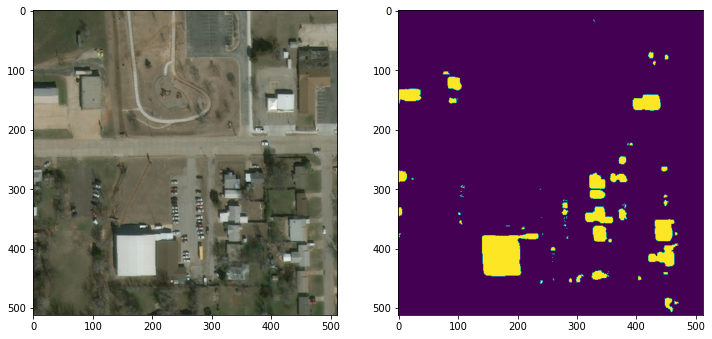

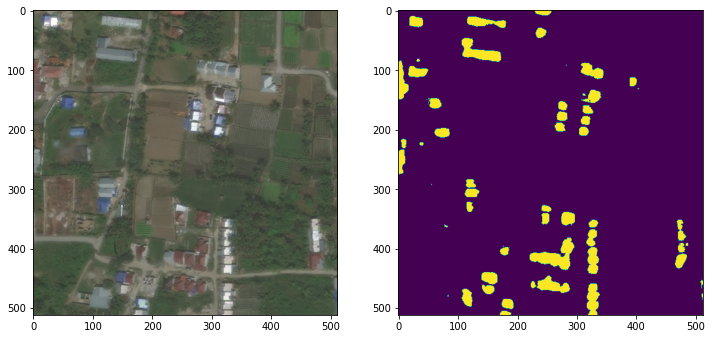

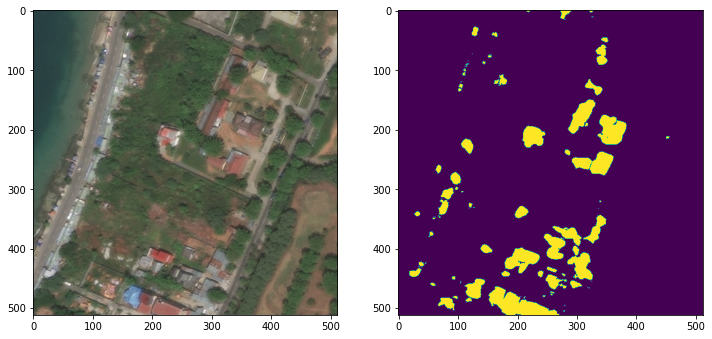

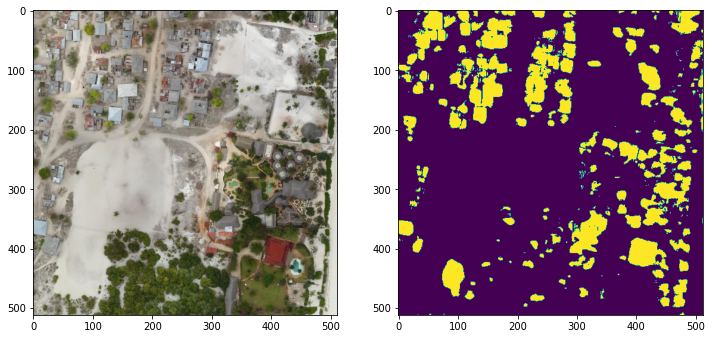

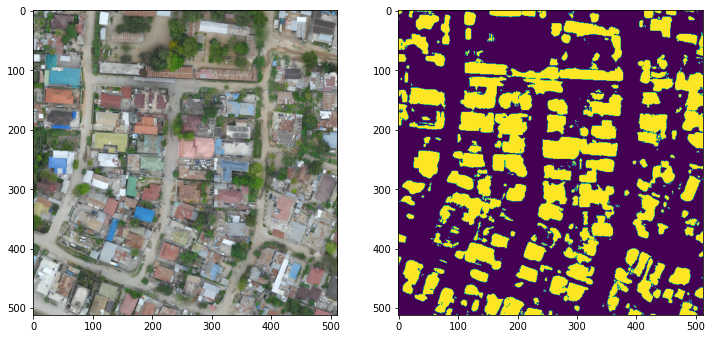

In [ ]:
# ======================
# Visualize results for test set
# ======================
from glob import glob

x_test_dir = os.path.join(data_dir, 'test_img')
test_files = glob(x_test_dir+'/*.png')

model.eval()

for f in test_files:
    image = cv2.imread(f, cv2.IMREAD_COLOR)
    input = image.transpose(2, 0, 1).astype('float32')
    x_tensor = torch.from_numpy(input).to(device).unsqueeze(0)

    prediction = model(x_tensor)
    prediction = (prediction > 0).long().squeeze().cpu().numpy().round()

    rgb = input.transpose(1, 2, 0)

    plt.figure(figsize=(12,12))
    plt.subplot(1,2,1)
    plt.imshow(rgb[:,:,[2,1,0]]/255)
    plt.subplot(1,2,2)
    plt.imshow(prediction)
    plt.show()

    rgb_fname = pathlib.Path(f).stem
    prediction = (prediction*255).astype('uint8')
    prediction = cv2.resize(prediction, (512, 512), interpolation=cv2.INTER_CUBIC)
    # save prediction with the original image size
    cv2.imwrite(pred_dir + rgb_fname + '.png', prediction)